In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import nltk

from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
from nltk import word_tokenize
nltk.download('stopwords')
from nltk.corpus import stopwords
stops = set(stopwords.words('english'))
import string
punct = list(string.punctuation)
from scipy import linalg

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

from itertools import chain

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
import plotly.express as px
from PIL import Image

[nltk_data] Downloading package stopwords to /home/jovyan/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


GitHub Link:
https://github.com/danielkoni/Testament-Comparison-NLP

# A comparative NLP study of the old testament and the new testament

In modern politics due to the fast increase of connectivity both via internet and flights people are moving around more and ideas are quickly changing, leading to increased polarity and opinions. Finding unity among your population is an important aspect of political discourse. Sentences such as Judeo-Christian values (integrating Christianity and Judaism), or Abrahamic religious values (Integrating Islam, Judaism and Christianity) are becoming more prevalent(Hemler, 2020). But the only matching part of the biblical and Quran records stems from the Old Testament(Ali, 2011). In aim of unity theological education in the west has shifted to teaching old testament stories and narratives as a way to unite the differing cultures.

The aim of this study is to see if there are empirical grounds to do so. If the New Testament and the Old testament are similar in valence (emotional positivity), dominance (sense of control) and arousal (action-oriented feelings) as well as in embedded co-occurrence of words then there may be evidence that the two texts seek to teach similar things (Warriner et al., 2013). But if certain contradictory ideas, for example that of the God of the old testament being more ruthless than the God of the new, are true then their levels of sentiment would be quite different, potentially as though the religions have intrinsically distinct emotional teachings (Donahue, 2023). This puts the policy of religious unity at odds with cultural authenticity and can be seen as an implicit replacement of one religious school by another.

### Hypothesis
Null hypothesis: The Old and New Testaments exhibit statistically similar emotional and semantic characteristics.
Alternative Hypothesis: Significant differences exist in the emotional makeup of the words in the Old and New Testaments, reflecting possibly distinct theological perspectives.

The objective is not to necessarily find the exact difference or its location in the text but to identify if some differences can be measured, which could then promote further research into the qualitative substance of theses bodies of texts.

### Methodology
In this study we use the VAD (Valence, Arousal, Dominance) data from the Lancaster study to analyze emotional content in biblical texts. By comparing statistical averages from each testament we aim to quantify variations in emotional content.

To find further differences, we'll use TF-IDF vectorization on both texts while maintaining labels of Testamenet origin (Abubakar et al., 2022). This approach can help us identify clusters that appear in one testament but not the other, using co-occurrence patterns as a way for detecting distinct groups of differing sentences.

In [3]:
#Open and read the text file
with open('KJV.txt', 'r') as f:
    bible = f.read()

In [4]:
len(bible)

4353681

In [5]:
#Cleaning the text: removes non-ASCII characters, normalize spaces
bible = bible.encode('ascii', 'ignore').decode()
bible = ' '.join(bible.splitlines())

In [6]:
len(bible)

4351708

### THE FOLLOWING CELL SPLITS THE BIBLE AND CREATES 2 NEW FILES, ONLY USE IF YOU DON'T HAVE THE SPLIT FILES:

In [7]:
#Since the index has the title of the new testament I had to split it at the second occurence of the title
N = 2

#finding occurences of the new testament title
split_point = "The New Testament of the King James Bible"
occurrences = [i for i in range(len(bible)) if bible.startswith(split_point, i)]

if len(occurrences) >= N:
    split_index = occurrences[N - 1]  #takes the N-th occurrence
    
    old_testament = bible[:split_index].strip()
    new_testament = bible[split_index:].strip()

    #saving Old Testament
    with open('Old_Testament.txt', 'w') as f:
        f.write(old_testament)

    #saving the New Testament
    with open('New_Testament.txt', 'w') as f:
        f.write(new_testament)

    print(f"Split at occurrence {N}. Files created: Old_Testament.txt and New_Testament.txt")
else:
    print(f"Only {len(occurrences)} occurrences found. Cannot split at occurrence {N}.")

Split at occurrence 2. Files created: Old_Testament.txt and New_Testament.txt


In [7]:
with open('New_Testament.txt', 'r') as n:
    New_Testament = n.read()
len(New_Testament)

1016628

In [8]:
with open('Old_Testament.txt', 'r') as n:
    Old_Testament = n.read()
len(Old_Testament)

3335074

In [9]:
#checking that the word amounts match after splitting
len(Old_Testament) + len(New_Testament)

4351702

In [10]:
#cleaning, splitting by sentences
New_Testament = New_Testament.encode('ascii', 'ignore')
New_Testament = New_Testament.decode()
New_Testament = ' '.join(New_Testament.splitlines())
New_Testament = New_Testament.lower()

In [11]:
New_Testament = New_Testament.split('.')
New_Testament = [i.strip() for i in New_Testament]

In [12]:
Old_Testament = Old_Testament.encode('ascii', 'ignore')
Old_Testament = Old_Testament.decode()
Old_Testament = ' '.join(Old_Testament.splitlines())
Old_Testament = Old_Testament.lower()

In [13]:
Old_Testament = Old_Testament.split('.')
Old_Testament = [i.strip() for i in Old_Testament]

In [14]:
New_Testament[0]

'the new testament of the king james bible     the gospel according to saint matthew   1:1 the book of the generation of jesus christ, the son of david, the son of abraham'

In [15]:
Old_Testament[0]

'the project gutenberg ebook of the king james bible  this ebook is for the use of anyone anywhere in the united states and most other parts of the world at no cost and with almost no restrictions whatsoever'

In [16]:
#using the good tokenixer and lemmatizer from class

def good_tokens(text):
    words = word_tokenize(text)
    lemmas = [lemmatizer.lemmatize(i).lower() for i in words]
    lemmas = [i for i in lemmas if i not in stops and i not in punct]
    return lemmas

In [17]:
#tokenizing into words

New_tokens = [good_tokens(i) for i in New_Testament]

In [18]:
#tokenizing into words

Old_tokens = [good_tokens(i) for i in Old_Testament]

In [19]:
New_tokens[0]

['new',
 'testament',
 'king',
 'james',
 'bible',
 'gospel',
 'according',
 'saint',
 'matthew',
 '1:1',
 'book',
 'generation',
 'jesus',
 'christ',
 'son',
 'david',
 'son',
 'abraham']

In [20]:
Old_tokens[1]

['may',
 'copy',
 'give',
 'away',
 're-use',
 'term',
 'project',
 'gutenberg',
 'license',
 'included',
 'ebook',
 'online',
 'www']

In [21]:
len(Old_tokens)

19796

In [22]:
len(New_tokens)

6626

In [23]:
#to do the VAD analysis I will first flatten out the tokens into a list of all the words
Old_words = list(chain.from_iterable(Old_tokens))
New_words = list(chain.from_iterable(New_tokens))

In [24]:
Old_words[0:5]

['project', 'gutenberg', 'ebook', 'king', 'james']

In [25]:
vad = pd.read_csv('vad.csv', index_col = 0)

In [26]:
vad.columns

Index(['V.Mean.Sum', 'V.SD.Sum', 'V.Rat.Sum', 'A.Mean.Sum', 'A.SD.Sum',
       'A.Rat.Sum', 'D.Mean.Sum', 'D.SD.Sum', 'D.Rat.Sum', 'V.Mean.M',
       'V.SD.M', 'V.Rat.M', 'V.Mean.F', 'V.SD.F', 'V.Rat.F', 'A.Mean.M',
       'A.SD.M', 'A.Rat.M', 'A.Mean.F', 'A.SD.F', 'A.Rat.F', 'D.Mean.M',
       'D.SD.M', 'D.Rat.M', 'D.Mean.F', 'D.SD.F', 'D.Rat.F', 'V.Mean.Y',
       'V.SD.Y', 'V.Rat.Y', 'V.Mean.O', 'V.SD.O', 'V.Rat.O', 'A.Mean.Y',
       'A.SD.Y', 'A.Rat.Y', 'A.Mean.O', 'A.SD.O', 'A.Rat.O', 'D.Mean.Y',
       'D.SD.Y', 'D.Rat.Y', 'D.Mean.O', 'D.SD.O', 'D.Rat.O', 'V.Mean.L',
       'V.SD.L', 'V.Rat.L', 'V.Mean.H', 'V.SD.H', 'V.Rat.H', 'A.Mean.L',
       'A.SD.L', 'A.Rat.L', 'A.Mean.H', 'A.SD.H', 'A.Rat.H', 'D.Mean.L',
       'D.SD.L', 'D.Rat.L', 'D.Mean.H', 'D.SD.H', 'D.Rat.H'],
      dtype='object')

In [27]:
#this function matches the VAD statistics to the words
def vad_data(word_list):
    word_list = [i.lower() for i in word_list]
    words = []
    norms = []
    
    for i in word_list:
        if i in vad.index:
            norms.append(vad.loc[i])
            words.append(i)
        else:
            pass
    norms_vad = pd.DataFrame(norms, index = words)
    return norms_vad

In [28]:
#this function applies the previous function and then uses the data to immediately graph
#our result between each metric. I chose to go for a 3 by 3 vizualizations because having both
#testaments overlap looked too messy so I added them as separate graphs below as well.

def plot_vad_comparisons(Old_words, New_words, vad):
    
    #first we get the VAD data for both testaments
    old_vad = vad_data(Old_words)
    new_vad = vad_data(New_words)
    
    #then we pre-set figures with subplots in a 3 by 3 layout so it looks better
    fig, axes = plt.subplots(3, 3, figsize=(20, 18))  
    
    
    plot_configs = [
        {'x': 'V.Mean.Sum', 'y': 'A.Mean.Sum', 'xlabel': 'Valence', 'ylabel': 'Arousal'},
        {'x': 'V.Mean.Sum', 'y': 'D.Mean.Sum', 'xlabel': 'Valence', 'ylabel': 'Dominance'},
        {'x': 'A.Mean.Sum', 'y': 'D.Mean.Sum', 'xlabel': 'Arousal', 'ylabel': 'Dominance'}
    ]
    
    #the first row will compare the Old vs New Testament
    for ax, config in zip(axes[0], plot_configs):
        sns.scatterplot(data=old_vad, 
                        x=config['x'], 
                        y=config['y'], 
                        alpha=0.5,
                        color='red',
                        label='Old Testament',
                        ax=ax,
                        marker='_')
        
        sns.scatterplot(data=new_vad, 
                        x=config['x'], 
                        y=config['y'], 
                        alpha=0.5,
                        color='blue',
                        label='New Testament',
                        ax=ax,
                        marker='_')
        
        ax.set_xlabel(config['xlabel'])
        ax.set_ylabel(config['ylabel'])
        ax.set_title(f'{config["xlabel"]} vs {config["ylabel"]} (Old vs New)')
        ax.grid(True, alpha=0.3)
        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)
        if ax != axes[0, 0]:
            ax.get_legend().remove()
    
    #the second row will show the Old Testament only
    for ax, config in zip(axes[1], plot_configs):
        sns.scatterplot(data=old_vad, 
                        x=config['x'], 
                        y=config['y'], 
                        alpha=0.5,
                        color='red',
                        ax=ax,
                        marker='_')
        
        ax.set_xlabel(config['xlabel'])
        ax.set_ylabel(config['ylabel'])
        ax.set_title(f'{config["xlabel"]} vs {config["ylabel"]} (Old Testament)')
        ax.grid(True, alpha=0.3)
        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)
    
    #the third row will only have the New Testament to help us compare the two
    for ax, config in zip(axes[2], plot_configs):
        sns.scatterplot(data=new_vad, 
                        x=config['x'], 
                        y=config['y'], 
                        alpha=0.5,
                        color='blue',
                        ax=ax,
                        marker='_')
        
        ax.set_xlabel(config['xlabel'])
        ax.set_ylabel(config['ylabel'])
        ax.set_title(f'{config["xlabel"]} vs {config["ylabel"]} (New Testament)')
        ax.grid(True, alpha=0.3)
        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)
    
    plt.suptitle('VAD Comparisons: Old vs New Testament', fontsize=20, y=1.02)
    plt.tight_layout()

    #adding a little bit of flavour for the total amount of words comparison
    stats_text = f"""
    Old Testament Words: {len(old_vad)}
    New Testament Words: {len(new_vad)}
    """
    plt.figtext(0.02, 0.02, stats_text, fontsize=12, ha='left')

    return fig

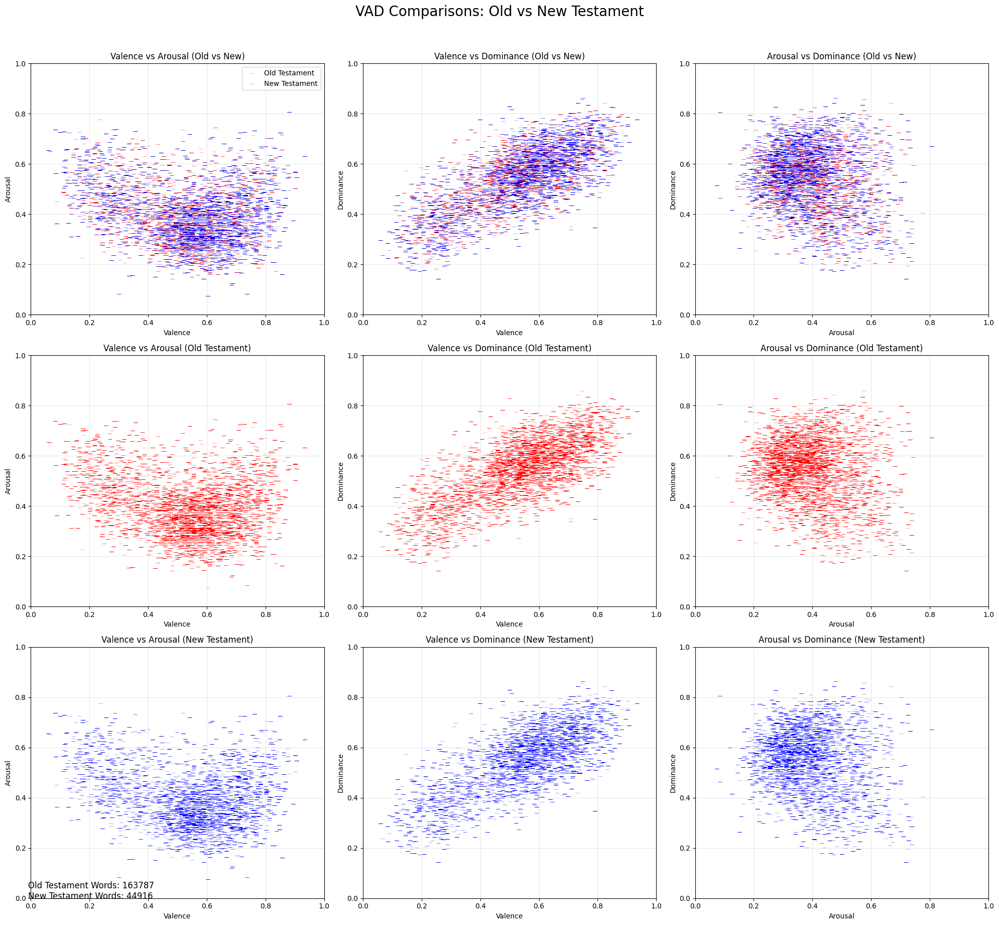

In [29]:
fig = plot_vad_comparisons(Old_words, New_words, vad)
plt.show()

As we can see the VAD comparison is really similar across the three metrics. This may be simply a feature of religious texts, or maybe its the way King James translated it in a homogeneous way. The hot spots seem to be in the same places and this contradicts our alternative hypothesis.
Let's compare the average statistics:

In [30]:
#let's make a function that will produce a nice table of stats to then visualize a comparison of the data
def calculate_vad_stats(tokens, vad, book_name):
    #flattening the tokens in case I forget to do it with a different list of tokens
    if isinstance(tokens[0], list):
        words = list(chain.from_iterable(tokens))
    else:
        words = tokens
    
    
    book_vad = vad_data(words)
    
    #taking the stats
    stats = {
        'Book': book_name,
        'Word_Count': len(book_vad),
        
        
        'Valence_Mean': book_vad['V.Mean.Sum'].mean(),
        'Valence_Median': book_vad['V.Mean.Sum'].median(),
        'Valence_SD': book_vad['V.Mean.Sum'].std(),
        'Valence_Min': book_vad['V.Mean.Sum'].min(),
        'Valence_Max': book_vad['V.Mean.Sum'].max(),
        
        
        'Arousal_Mean': book_vad['A.Mean.Sum'].mean(),
        'Arousal_Median': book_vad['A.Mean.Sum'].median(),
        'Arousal_SD': book_vad['A.Mean.Sum'].std(),
        'Arousal_Min': book_vad['A.Mean.Sum'].min(),
        'Arousal_Max': book_vad['A.Mean.Sum'].max(),
        
        
        'Dominance_Mean': book_vad['D.Mean.Sum'].mean(),
        'Dominance_Median': book_vad['D.Mean.Sum'].median(),
        'Dominance_SD': book_vad['D.Mean.Sum'].std(),
        'Dominance_Min': book_vad['D.Mean.Sum'].min(),
        'Dominance_Max': book_vad['D.Mean.Sum'].max()
    }
    
    return pd.Series(stats)

In [31]:
#now let's make a df of the data
def compare_testaments(Old_tokens, New_tokens, vad):
    # Calculate stats for both testaments
    old_stats = calculate_vad_stats(Old_tokens, vad, 'Old Testament')
    new_stats = calculate_vad_stats(New_tokens, vad, 'New Testament')
    
    comparison_df = pd.DataFrame([old_stats, new_stats])
    
    #rounding them up to 3 spaces
    numeric_columns = comparison_df.select_dtypes(include=[np.number]).columns
    comparison_df[numeric_columns] = comparison_df[numeric_columns].round(3)
    
    column_order = ['Book', 'Word_Count',
                   'Valence_Mean', 'Arousal_Mean', 'Dominance_Mean', 'Valence_Median', 'Valence_SD', 'Valence_Min',
                    'Valence_Max', 'Arousal_Median', 'Arousal_SD', 'Arousal_Min', 'Arousal_Max',
                    'Dominance_Median', 'Dominance_SD', 'Dominance_Min', 'Dominance_Max']
    
    return comparison_df[column_order]

In [32]:
comparison_table = compare_testaments(Old_words, New_words, vad)

In [33]:
display(comparison_table.style.highlight_max(axis=0, color='lightgreen').highlight_min(axis=0, color='lightpink'))

,Book,Word_Count,Valence_Mean,Arousal_Mean,Dominance_Mean,Valence_Median,Valence_SD,Valence_Min,Valence_Max,Arousal_Median,Arousal_SD,Arousal_Min,Arousal_Max,Dominance_Median,Dominance_SD,Dominance_Min,Dominance_Max
0,Old Testament,163787,0.588000,0.384000,0.565000,0.608000,0.148000,0.060000,0.934000,0.360000,0.105000,0.075000,0.806000,0.581000,0.100000,0.142000,0.858000
1,New Testament,44916,0.591000,0.389000,0.566000,0.608000,0.155000,0.060000,0.934000,0.369000,0.109000,0.075000,0.806000,0.576000,0.110000,0.142000,0.862000


The two testaments are really similar. Now maybe they use a large proportion of VAD scores and they are simply giving back the averages of the vad stats. If we compare the total averages of the vad stats we might gain an insight.

In [34]:
mean_v = vad['V.Mean.Sum'].mean()
mean_a = vad['A.Mean.Sum'].mean()
mean_d = vad['D.Mean.Sum'].mean()

print(f"Mean of V.Mean.Sum: {mean_v}")
print(f"Mean of A.Mean.Sum: {mean_a}")
print(f"Mean of D.Mean.Sum: {mean_d}")

Mean of V.Mean.Sum: 0.5079808659719728
Mean of A.Mean.Sum: 0.4013227632051743
Mean of D.Mean.Sum: 0.5230965684513115


The testaments are higher in valence, slightly lower in arousal and higher in dominance than the VAD average.
This suggests that the two texts are in fact quite similar.
Another way to find difference in meaning is by vectorizing and embedding the words.

I attempted Gensim but got a similar issue as in class and after trying the Sklearn Vectorizer the kernel crashed.
Thus I decided to use the tf-idf vectorizer as I am more familiar with tf-idf and can understand what is happening, and it is less RAM intensive.

Using a TF-IDF vectorizer I will be able vectorize words and then give them values of co-occurence with other words, thus making a text-specific connection of such words.

TF-IDF treats each sentence independently, giving high scores to words that appear frequently in one sentence but rarely across all sentences in the entire Bible. The clustering then groups these sentence vectors based on their word importance patterns. We will then get to see which testament they're from because we will keep track with our labels.
So the distinct clusters we're looking for are not showing testament-specific language, but rather sentences with similar internal word patterns that might happen to occur more in one testament than the other, which would suggest a difference in the structure and word-value between the two testaments.

In [35]:
#to do so first I'll need to convert tokens into sentences/strings
old_sentences = [' '.join(map(str, sentence)) for sentence in Old_tokens]
new_sentences = [' '.join(map(str, sentence)) for sentence in New_tokens]
all_sentences = old_sentences + new_sentences
old_sentences[0]

'project gutenberg ebook king james bible ebook use anyone anywhere united state part world cost almost restriction whatsoever'

In [36]:
#then make a few labels to keep track of which testament they origninated from
old_labels = ['Old'] * len(old_sentences)
new_labels = ['New'] * len(new_sentences)
sentence_origins = old_labels + new_labels

In [37]:
#now I vectorize using a feature limiter to not overburden our ram
vectorizer = TfidfVectorizer(max_features=1000)
X = vectorizer.fit_transform(all_sentences)

In [38]:
#reducing the dimensionality to 3 dimensions so we can visualize it
svd = TruncatedSVD(n_components=3, random_state=30)
svd_result = svd.fit_transform(X)

In [39]:
df = pd.DataFrame(svd_result, columns=['PC 1', 'PC 2', 'PC 3'])

In [40]:
#clustering the sentences
from sklearn.cluster import MiniBatchKMeans
kmeans = MiniBatchKMeans(n_clusters=7, random_state=0, n_init="auto")
cluster_labels = kmeans.fit_predict(X)

In [41]:
#ading the labels
df['clusters_knn'] = [str(i) for i in cluster_labels]
df['Testament'] = sentence_origins
df['Sentence'] = all_sentences

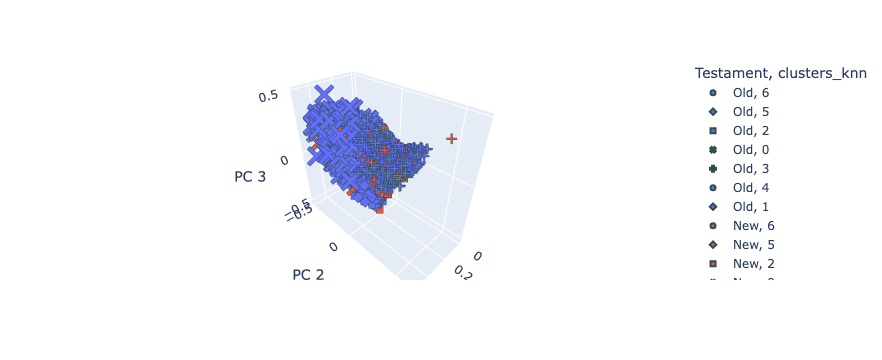

In [42]:
fig = px.scatter_3d(df, x='PC 1', y='PC 2', z='PC 3',
                    color='Testament',  
                    symbol='clusters_knn',  
                    hover_data=['Sentence'])
fig.update_traces(marker=dict(size=5, line=dict(width=2, color='DarkSlateGrey')),
                  selector=dict(mode='markers'))
fig.show()

By looking at the clusters most of the Old Testament and New Testament clusters overlap. All except for the Old Testament cluster 3, where it fills an empty space that the New Testament doesn't overlap with. These sentences when compared across the whole Bible end up being for some reason different. They do look like command/rule sentences using the words "you shall" often. The image below shows the gap in the clustering:

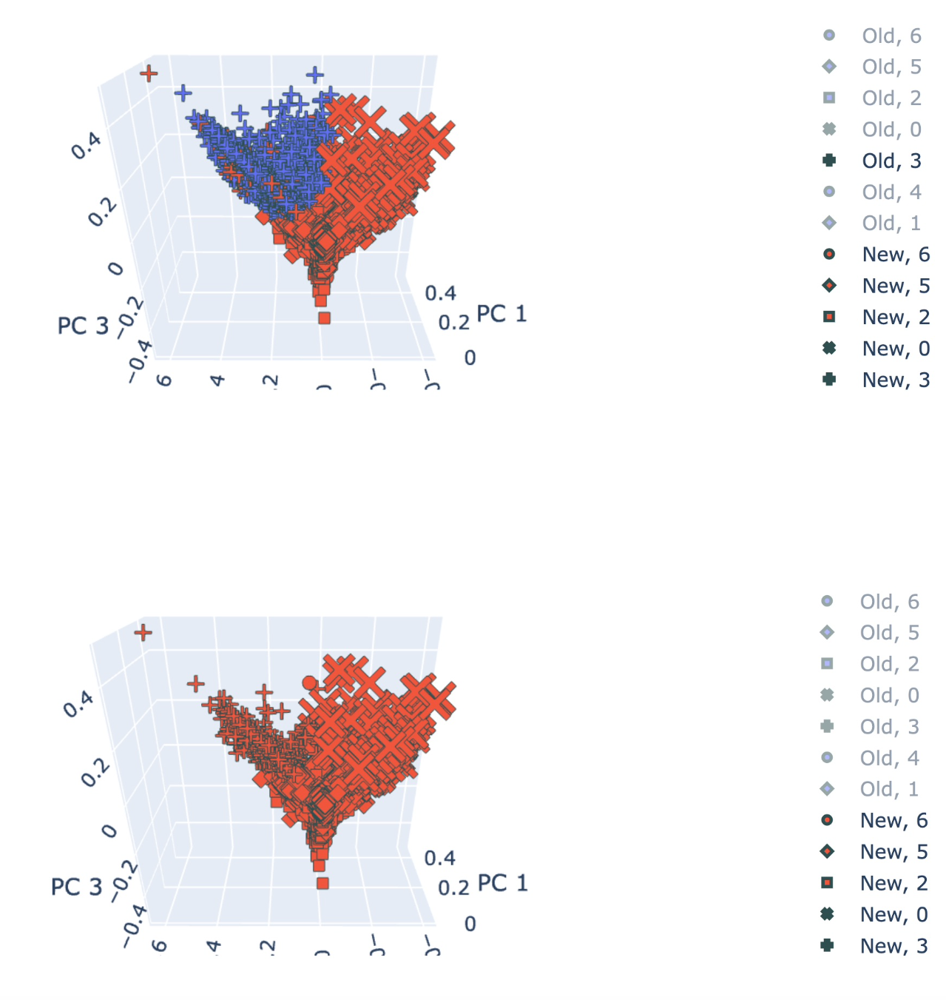

In [43]:
img = Image.open('Hearts.png')
display(img)

Now to see if the third cluster differs emotionally between the old testament and the new testament we can simply re-do the VAD analysis. Since the Old-Testament has more words we should see a distinction in the values that would be wider than inbetween both testaments' averages.

In [44]:
cluster_3_sentences = df[(df['clusters_knn'] == '3')]

#taking the third cluster and splitting into 2
old_cluster_3 = cluster_3_sentences[cluster_3_sentences['Testament'] == 'Old']['Sentence'].tolist()
new_cluster_3 = cluster_3_sentences[cluster_3_sentences['Testament'] == 'New']['Sentence'].tolist()

old_cluster_3[0]

'2:24 therefore shall man leave father mother shall cleave unto wife shall one flesh'

In [45]:
Old_3 = [good_tokens(i) for i in old_cluster_3]
New_3 = [good_tokens(i) for i in new_cluster_3]
Old_cluster = list(chain.from_iterable(Old_3))
New_cluster = list(chain.from_iterable(New_3))

In [46]:
Old_cluster[0:5]

['2:24', 'therefore', 'shall', 'man', 'leave']

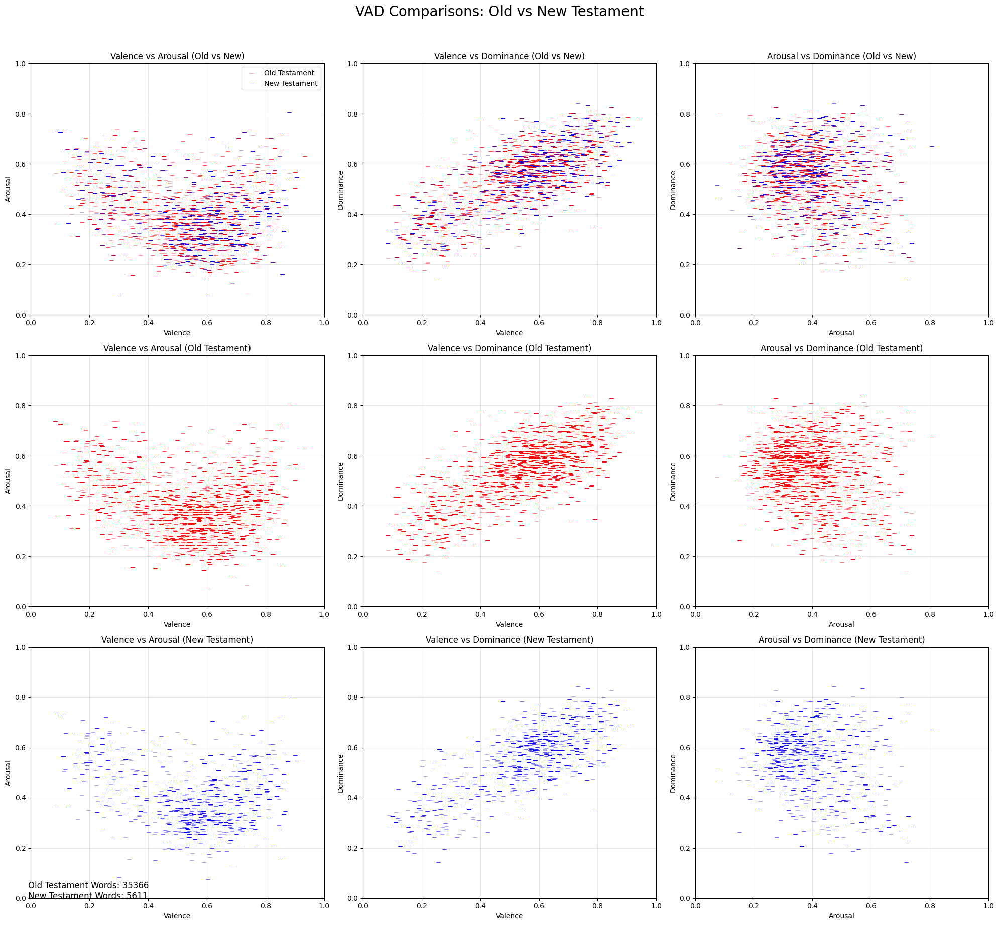

In [47]:
fig = plot_vad_comparisons(Old_cluster, New_cluster, vad)
plt.show()

In [48]:
cluster3_comparison_table = compare_testaments(Old_cluster, New_cluster, vad)

In [49]:
display(cluster3_comparison_table.style.highlight_max(axis=0, color='lightgreen').highlight_min(axis=0, color='lightpink'))

,Book,Word_Count,Valence_Mean,Arousal_Mean,Dominance_Mean,Valence_Median,Valence_SD,Valence_Min,Valence_Max,Arousal_Median,Arousal_SD,Arousal_Min,Arousal_Max,Dominance_Median,Dominance_SD,Dominance_Min,Dominance_Max
0,Old Testament,35366,0.574000,0.378000,0.567000,0.608000,0.147000,0.084000,0.934000,0.346000,0.105000,0.075000,0.806000,0.594000,0.102000,0.142000,0.835000
1,New Testament,5611,0.591000,0.383000,0.573000,0.608000,0.147000,0.084000,0.906000,0.351000,0.105000,0.075000,0.806000,0.601000,0.104000,0.142000,0.842000


In [50]:
display(comparison_table.style.highlight_max(axis=0, color='lightgreen').highlight_min(axis=0, color='lightpink'))

,Book,Word_Count,Valence_Mean,Arousal_Mean,Dominance_Mean,Valence_Median,Valence_SD,Valence_Min,Valence_Max,Arousal_Median,Arousal_SD,Arousal_Min,Arousal_Max,Dominance_Median,Dominance_SD,Dominance_Min,Dominance_Max
0,Old Testament,163787,0.588000,0.384000,0.565000,0.608000,0.148000,0.060000,0.934000,0.360000,0.105000,0.075000,0.806000,0.581000,0.100000,0.142000,0.858000
1,New Testament,44916,0.591000,0.389000,0.566000,0.608000,0.155000,0.060000,0.934000,0.369000,0.109000,0.075000,0.806000,0.576000,0.110000,0.142000,0.862000


Comparing the graphs and the data despite the vecotorizer suggesting a difference, the numbers are staying quite consistent with only a slight decrease (of 2.4%) in the valence mean of the Old Testament cluster from 0.588 to 0.574. The arousal slightly went up but it also went up for the New Testament. Thus, I must conclude that for this NLP analysis of the Holy Bible by King James I have to reject the alternative hypothesis. The Null Hypothesis stays true. Despite seemingly different portrayals of God and his moral guidances the two texts are actually quite similar in terms of sentiment.


### Limitations

This analysis looked only at the King James Version which may have introduce translational artifacts. Secondly, the computational approach does not capture the hermeneutical complexities of theological interpretation. Thirdly, sentiment-level analysis provides only one perspective on textual understanding, leaving a lot of room for other qualitative and quantitative approaches.

Future research could include a multilingual biblical text comparisons, exploring translation variances, and using more advanced neural network models for a deeper semantic analysis. I will leave these tasks to the scholars of theology, linguistics, and computational humanities.


### Conclusion

This NLP analysis looked to find sentimental and vectorization differences between the Old and the New Testaments of the Holy Bible. The result found the two texts to be remarkably similar. Particularly intriguing was the discovery of a cluster within the Old Testament that suggests some difference but that difference was most likely not one of sentiment difference and may require further inquiry.


This work contains 1018 words


### References


Abubakar, H. D., Umar, M., & Bakale, M. A. (2022). Sentiment classification: Review of text vectorization methods: Bag of words, Tf-Idf, Word2vec and Doc2vec. SLU Journal of Science and Technology, 4(1), 27-33.

Ali, M. Y. (2011). The three Abrahamic faiths and their roles in making peace, unity and co-existence. World Journal of Islamic History and Civilization, 1(3), 187-200.

Donahue, P. (2023, August 3). Reasons We Should Study The New Testament. Bible Crossfire. https://www.biblecrossfire.com/blog/reasons-we-should-study-the-new-testament#:~:text=We%20learn%20how%20to%20be,5%3A3%2D4).

Hemler, J. (2020). American Faith Adrift: The Rise of Religious Nones and the Influence of Political Polarization (Doctoral dissertation, Johns Hopkins University).

Warriner, A. B., Kuperman, V., & Brysbaert, M. (2013). Norms of valence, arousal, and dominance for 13,915 English lemmas. Behavior research methods, 45, 1191-1207.